In [12]:
%load_ext autoreload
%autoreload 2

# general
import numpy as np
import pandas as pd
from tqdm.auto import tqdm
from scipy.interpolate import interp1d

# plotting
import matplotlib.pyplot as plt
from ipywidgets import interact
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import seaborn as sns

# fitting
from sklearn.metrics import r2_score
from scipy.optimize import minimize
from functools import partial
import multiprocess as mp
import matplotlib.patches as mpatches

# custom
from reflectance import plotting, spectrum_utils, optimisation_pipeline, file_ops

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Simulated data

In [ ]:
AOP_model = spectrum_utils.load_aop_model(aop_group_num=1)
wvs = AOP_model.index
AOP_sub = AOP_model.loc[wvs]
AOP_args = (AOP_sub.bb_m.values, AOP_sub.bb_c.values, AOP_sub.Kd_m.values, AOP_sub.Kd_c.values)

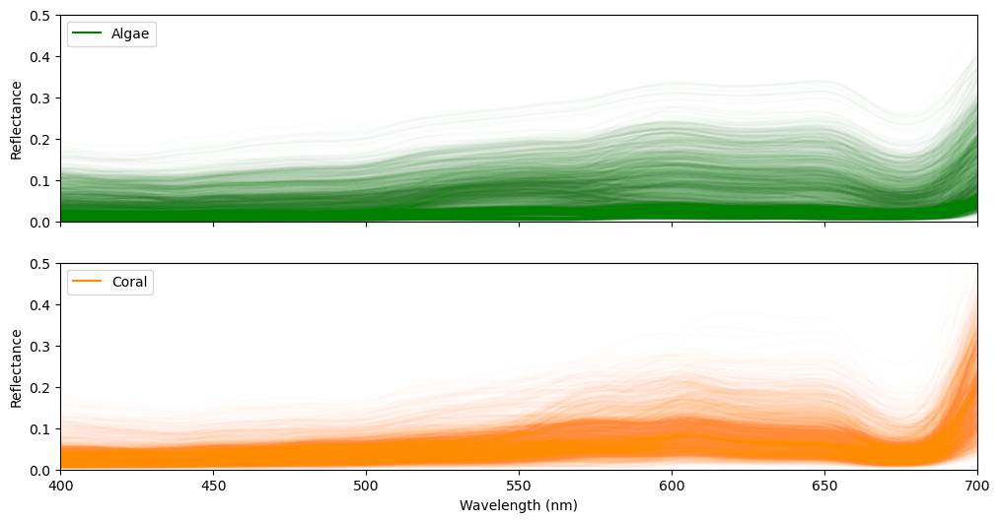

In [ ]:
# read in spectral library
f = file_ops.RESOURCES_DIR_FP / "spectral_library_clean_v3_PRISM_wavebands.csv"
df = pd.read_csv(f, skiprows=1).set_index('wavelength')
df.columns = df.columns.astype(float)
df = df.astype(float)
# group coral and algae types
coral = df.loc[df.index.str.contains('coral'), :]
algae = df.loc[df.index.str.contains('algae'), :]

fig, (ax_algae, ax_coral) = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
ax_algae.plot(algae.T, color="g", alpha=0.01)
ax_coral.plot(coral.T, color="darkorange", alpha=0.01)
ax_algae.plot([],[],color="g", label="Algae")
ax_coral.plot([],[],color="darkorange", label="Coral")
ax_coral.set_xlabel("Wavelength (nm)")

for ax in (ax_algae, ax_coral):
    ax.set_ylabel("Reflectance")
    ax.legend()
    ax.set_xlim(400, 700)
    ax.set_ylim(0, 0.5)

In [ ]:
coralgal_cmap = mcolors.LinearSegmentedColormap.from_list("coralalgae", ["g", "darkorange"])
plotting.plot_interactive_coral_algae_spectrum(coral, algae, n_samples=100, coralgal_cmap=coralgal_cmap)

In [ ]:
# different water types
water_dict = {
    1: {"K": 0.1, "bb": 0.01, "type": "Clear"},
    2: {"K": 0.2, "bb": 0.02, "type": "Turbid"},
    3: {"K": 0.3, "bb": 0.03, "type": "Very Turbid"},
} 

In [ ]:
test_grouped = spectrum_utils.group_classes(df, four_em_cats)
test_grouped.head()

,390.346814,393.177859,396.008959,398.840115,401.671328,404.502597,407.333922,410.165304,412.996742,415.828236,...,682.239779,685.076616,687.913509,690.750458,693.587464,696.424526,699.261643,702.098818,704.936048,707.773335
class,,,,,,,,,,,,,,,,,,,,,
CCA,0.020728,0.020227,0.020005,0.020084,0.020356,0.020683,0.020920,0.020976,0.020858,0.020672,...,0.038188,0.040405,0.043873,0.048677,0.054774,0.061951,0.069851,0.078045,0.086064,0.093488
CCA,0.027522,0.027614,0.027608,0.027419,0.027112,0.026736,0.026288,0.025762,0.025216,0.024735,...,0.037139,0.039624,0.043634,0.049299,0.056548,0.065073,0.074396,0.083941,0.093178,0.101670
CCA,0.043843,0.043565,0.042993,0.042260,0.041528,0.040853,0.040226,0.039740,0.039510,0.039522,...,0.086160,0.091666,0.099919,0.110885,0.124224,0.139262,0.155143,0.170886,0.185670,0.198911
CCA,0.016587,0.016530,0.016400,0.016412,0.016555,0.016686,0.016676,0.016535,0.016377,0.016361,...,0.047909,0.051187,0.055683,0.061343,0.067899,0.074864,0.081724,0.088126,0.093939,0.099139
CCA,0.012677,0.012897,0.013042,0.013080,0.013065,0.013026,0.012993,0.012916,0.012836,0.012851,...,0.031100,0.033334,0.036624,0.040983,0.046259,0.052126,0.058170,0.064002,0.069371,0.074157


In [ ]:
tests_em = spectrum_utils.mean_endmembers(test_grouped)

In [ ]:
four_em_cats = {
    'algae': ['algae_fleshy_brown', 'algae_fleshy_green', 'algae_fleshy_red', 'algae_turf', 'seagrass'],
    'CCA': ['algae_crustose_coralline'],
    'coral': ['coral_blue', 'coral_brown', 'octocoral'],
    'sand': ['sand', 'mud']
}

four_endmembers = {}
for cat in four_em_cats:
    ind = df.index.isin(four_em_cats[cat])
    # select all spectra in category and calculate mean spectrum
    four_endmembers[cat] = df.loc[ind].mean(axis=0)
# create array of average spectrum for each category
four_endmember_array = np.array([spectrum.values for spectrum in four_endmembers.values()])

In [ ]:
# # representative values
# bb = 0.02
# K = 0.2
# H = 5

# # endmember weighting
# Rb0 = 1  # algae
# Rb1 = 0  # CCA
# Rb2 = 0  # coral
# Rb3 = 0  # sand


# sim = spectrum_utils.sub_surface_reflectance_Rb(wvs, endmember_array, bb, K, H, AOP_args, Rb0, Rb1, Rb2, Rb3)
# sim += np.random.normal(0, 1e-4, len(wvs))

# fig, axs = plt.subplots(2, 1, sharex=True, figsize=(12, 6))

# axs[0].plot(wvs, spectrum_utils.Rb_endmember(endmember_array, Rb0, Rb1, Rb2, Rb3), color='C1', label="Rb contribution")

# axs[1].plot(wvs, spectrum_utils.sub_surface_reflectance_Rb(wvs, endmember_array, bb, K, H, AOP_args, 0,0,0,0), label='Zero Rb')
# axs[1].plot(wvs, sim, label='Simulated surface retrieval')

# for ax in axs:
#     ax.set_xlim(wvs.min(), wvs.max())
#     ax.set_ylabel("Reflectance")
#     ax.legend()
# axs[1].set_xlabel("Wavelength (nm)")
# plt.tight_layout()

# bb = 0.02
# K = 0.2
# H = 5

# Rb0 = 0  # algae
# Rb1 = 0  # CCA
# Rb2 = 0.5  # coral
# Rb3 = 0  # sand


# num_samples = 10
# max_Rb = 1
# cmap = plt.cm.viridis
# cnorm = mcolors.Normalize(vmin=0, vmax=max_Rb)


# fig, axs = plt.subplots(2, 1, sharex=True, figsize=(12,7))

# for Rb2 in np.linspace(0, max_Rb, num_samples):
#     sim = spectrum_utils.sub_surface_reflectance_Rb(wvs, endmember_array, bb, K, H, AOP_args, Rb0, Rb1, Rb2, Rb3) 
#     axs[0].plot(wvs, spectrum_utils.Rb_endmember(endmember_array, Rb0, Rb1, Rb2, Rb3), color=cmap(cnorm(Rb2)), label="Zero Rb" if Rb2 == 0 else None)
#     axs[1].plot(wvs, sim, color=cmap(cnorm(Rb2)), label="Zero Rb" if Rb2 == 0 else None)

# axs[0].set_title("Rb signal as function of coral fraction")
# axs[1].set_title("Simulated surface retrieval as function of coral fraction")
# ma = plt.cm.ScalarMappable(cmap=cmap, norm=cnorm)

# for ax in axs:
#     ax.set_xlim(wvs.min(), wvs.max())
#     ax.set_ylabel("Reflectance")
#     fig.colorbar(ma, ax=ax, label="Rb2 proportion")
#     ax.grid(which="major", axis="x")
#     ax.legend()
# axs[1].set_xlabel("Wavelength (nm)");
# plt.tight_layout()

In [ ]:
three_em_cats = {
    'algae': ['algae_fleshy_brown', 'algae_fleshy_green', 'algae_fleshy_red', 'algae_turf', 'seagrass', 'algae_crustose_coralline'],
    'coral': ['coral_blue', 'coral_brown', 'octocoral'],
    'sand': ['sand', 'mud']
}

three_endmembers = {}
for cat in three_em_cats:
    ind = df.index.isin(three_em_cats[cat])
    # select all spectra in category and calculate mean spectrum
    three_endmembers[cat] = df.loc[ind].mean(axis=0)
# create array of average spectrum for each category
three_endmember_array = np.array([spectrum.values for spectrum in three_endmembers.values()])


In [ ]:
# Sample data for wavelengths and reflectance values
endmember_array = four_endmember_array
wvs = coral.columns
n_samples = 10
n_samples_depth = 21
max_depth = 10

# representative water AOPs
bb = 0.02
K = 0.2

depths = np.linspace(0, max_depth, n_samples_depth)
coral_fracs = np.linspace(0, 1, n_samples)
algae_fracs = np.linspace(0, 1, n_samples)
sand_fracs = np.linspace(0, 1, n_samples)

frac_spectra = np.zeros((n_samples, n_samples, n_samples, n_samples_depth, len(wvs)))

from tqdm.auto import tqdm

for i, coral_frac in tqdm(enumerate(coral_fracs), total=n_samples):
    for j, algae_frac in enumerate(algae_fracs):
        for k, sand_frac in enumerate(sand_fracs):
            for d, depth in enumerate(depths): 
                sim = spectrum_utils.sub_surface_reflectance_Rb(wvs, endmember_array, bb, K, depth, AOP_args, algae_frac, 0, coral_frac, sand_frac)
                frac_spectra[i, j, k, d] = sim
                
# save to numpy array if files don't exist already
np.save(file_ops.TMP_DIR_FP / "fractional_spectra.npy", frac_spectra) if not (file_ops.TMP_DIR_FP / "fractional_spectra.npy").exists() else None
np.save(file_ops.TMP_DIR_FP / "wavelengths.npy", wvs) if not (file_ops.TMP_DIR_FP / "wavelengths.npy").exists() else None
np.save(file_ops.TMP_DIR_FP / "fracs.npy", coral_fracs) if not (file_ops.TMP_DIR_FP / "fracs.npy").exists() else None

  0%|          | 0/10 [00:00<?, ?it/s]

In [ ]:


sim_spectra = simulate_spectra(
    three_endmember_array,  # endmember array
    (0, 1, 0))  # Rb values: algae, coral, sand


  0%|          | 0/100000 [00:00<?, ?it/s]

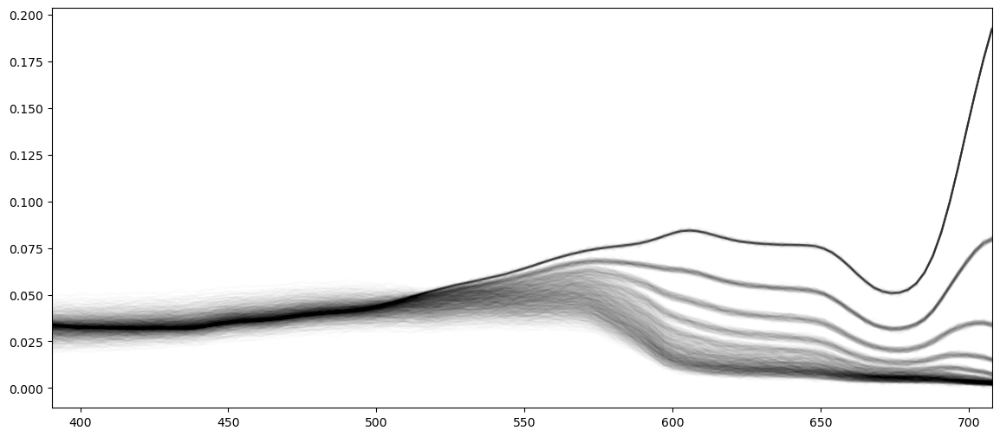

In [ ]:
# select range of along diagonal: for different values of the various parameters
# Generate random indices for the first dimension (samples)
sample_indices = np.random.randint(0, sim_spectra.shape[0], size=(sim_spectra.shape[1], sim_spectra.shape[2], sim_spectra.shape[3], sim_spectra.shape[4]))

# Generate indices for depth, K, bb, and noise levels using np.ogrid
depth_indices, K_indices, bb_indices, noise_indices = np.ogrid[:sim_spectra.shape[1], :sim_spectra.shape[2], :sim_spectra.shape[3], :sim_spectra.shape[4]]

# Use advanced indexing to select one spectrum for each combination
selected_spectra = sim_spectra[sample_indices, depth_indices, K_indices, bb_indices, noise_indices]

fig, spectrum_ax = plt.subplots(figsize=(14, 6))

# plot example spectra spanning top three axes via gridspec
spectrum_ax.plot(wvs, selected_spectra.reshape(-1, 113).T[:, ::9], color="k", alpha=0.01);
spectrum_ax.set_xlim(wvs.min(), wvs.max());


In [ ]:


spread_sim_spectra, metadata = spread_simulate_spectra(
    wvs,
    AOP_args,
    three_endmember_array,  # endmember array
    N=200,
    Rb_vals=(0.4, 0.4, 0.2))  # Rb values: algae, coral, sand

  0%|          | 0/200 [00:00<?, ?it/s]

In [1]:
endmember_array = three_endmember_array

i = 50
noise_level_ind = 9

# load in endmember data
AOP_sub = AOP_model.loc[wvs]
AOP_args = (AOP_sub.bb_m.values, AOP_sub.bb_c.values, AOP_sub.Kd_m.values, AOP_sub.Kd_c.values)

# endmember_bounds = (0, np.inf)
fit = minimize(
            spectrum_utils.r2_objective_fn,
            # spectrum_utils.spectral_angle_objective_fn,
            # initial parameter values
            x0=[0.1, 0.1, 0] + [0.0001] * len(endmember_array),
            # extra arguments passsed to the object function (and its derivatives)
            args=(spread_sim_spectra[i, noise_level_ind], # spectrum to fit (obs)
                  *AOP_args,    # wavelength-dependent backscatter and attenuation coefficients (bb_m, bb_c, Kd_m, Kd_c)
                  endmember_array  # typical end-member spectra
                  ),
            # constrain values
            # bounds=[(0, 0.41123), (0.01688, 3.17231), (0, 50)] + [endmember_bounds] * len(endmember_array),
            tol=1e-10,
            method='CG'
            ) # may not always want to constrain this (e.g. for PCs)


fitted_spectrum = calc_fitted_spectrum(fit, wvs, endmember_array, AOP_args)
plot_single_fit(fitted_spectrum, spread_sim_spectra[i, noise_level_ind], AOP_args, endmember_array, three_em_cats)

NameError: name 'three_endmember_array' is not defined

In [ ]:
endmember_array = three_endmember_array
cats = three_em_cats.keys()
# sim_spectra_df = pd.DataFrame(sim_spectra, columns=wvs)

noise_levels = np.linspace(0, 1e-3, 10)

dfs = {}
# for all example spectra, iterate over all noise levels
for n, nl in tqdm(enumerate(noise_levels), total=len(noise_levels)):
    spread_sim_spectra_df = pd.DataFrame(spread_sim_spectra[:50,n,:], columns=wvs)    
    partial_wrapper = partial(spectrum_utils._wrapper, of=spectrum_utils.r2_objective_fn, prism_spectra=spread_sim_spectra_df, AOP_args=AOP_args, endmember_array=endmember_array, method="CG", tol=1e-10, bb_bounds=None, Kd_bounds=None, H_bounds=None)
    # partial_wrapper = partial(spectrum_utils._wrapper, of=spectrum_utils.spectral_angle_objective_fn, prism_spectra=spread_sim_spectra_df, AOP_args=AOP_args, endmember_array=endmember_array, Rb_init=0.0001, method="L-BFGS-B", tol=1e-6)

    rerun=True
    # if rerun fitting process
    if rerun:
        with mp.Pool() as pool:
            result = list(tqdm(pool.imap(partial_wrapper, range(len(spread_sim_spectra_df))), total=len(spread_sim_spectra_df), leave=False))

        fits_df = pd.DataFrame(result, index=spread_sim_spectra_df.index, columns=['bb', 'K', 'H'] + list(cats))
    
    dfs[nl] = fits_df.iloc[:,3:]


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

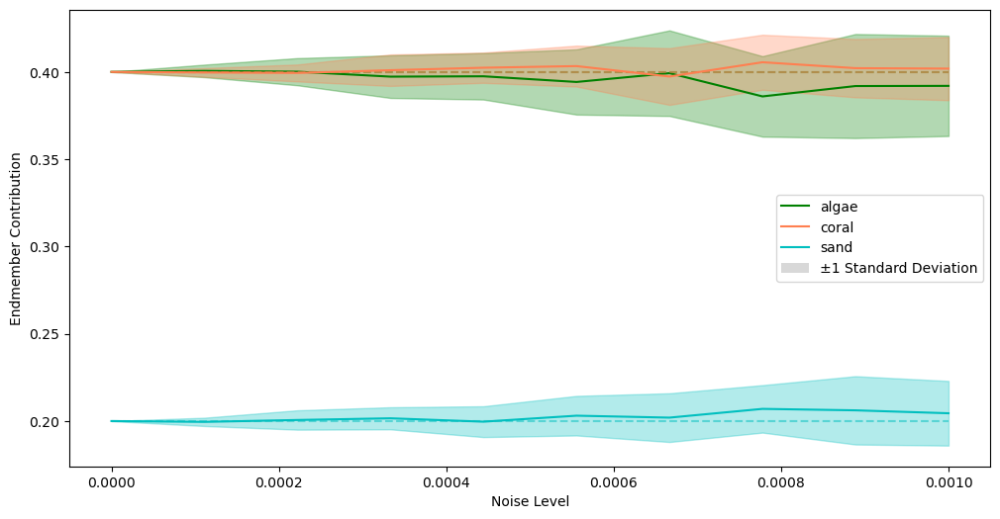

In [ ]:

    
plotting.plot_proportions(dfs, (0.4, 0.4, 0.2))

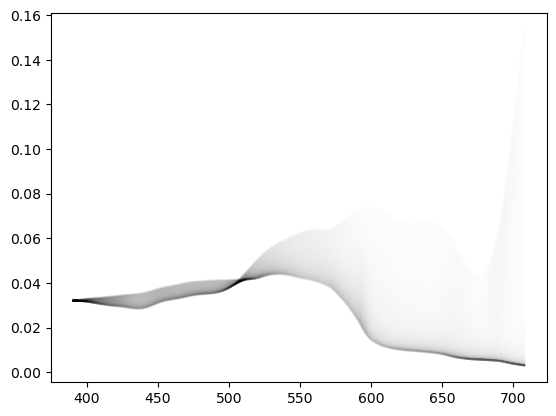

In [ ]:
endmember_array = three_endmember_array
sim_spectra_df = pd.DataFrame(spread_sim_spectra[:,0,:], columns=wvs)
plt.plot(wvs, sim_spectra_df.values.T, color='k', alpha=0.01);

In [ ]:
from functools import partial
import multiprocess as mp

partial_wrapper = partial(spectrum_utils._wrapper, of=spectrum_utils.r2_objective_fn, prism_spectra=sim_spectra_df, AOP_args=AOP_args, endmember_array=endmember_array, method="CG", tol=1e-10, bb_bounds=None, Kd_bounds=None, H_bounds=None)
# partial_wrapper = partial(spectrum_utils._wrapper, of=spectrum_utils.spectral_angle_objective_fn, prism_spectra=sim_spectra_df, AOP_args=AOP_args, endmember_array=endmember_array, Rb_init=0.0001, method="L-BFGS-B", tol=1e-6)

rerun=True
# if rerun fitting process
if rerun:
    with mp.Pool() as pool:
        result = list(tqdm(pool.imap(partial_wrapper, range(len(sim_spectra_df))), total=len(sim_spectra_df)))

    fits = pd.DataFrame(result, index=sim_spectra_df.index, columns=['bb', 'K', 'H'] + list(cats))
    # fits.to_csv('tmp/fits_avg_endmembers_new.csv')
# else load in values from tempfile
else:
    fits = pd.read_csv(file_ops.TMP_DIR_FP / "fits_avg_endmembers_new.csv", index_col=0)
    # fits = pd.read_csv('tmp/fits_avg_endmembers_og.csv', index_col=0) # original
    
fits.head()

  0%|          | 0/200 [00:00<?, ?it/s]

KeyboardInterrupt: 

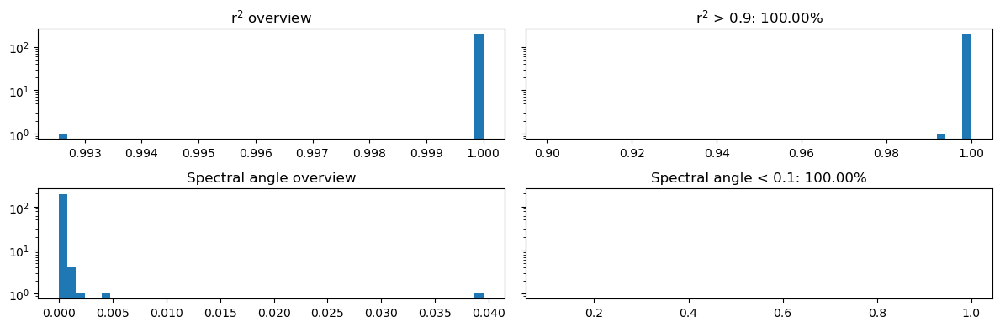

In [ ]:
pred_spectra = spectrum_utils.generate_spectra_from_fits(fits, sim_spectra_df.columns, endmember_array, AOP_args)
metrics = spectrum_utils.calculate_metrics(sim_spectra_df, pred_spectra)
    
fig, ax = plt.subplots(2, 2, figsize=(12, 4), sharey=True)
ax[0,0].hist(metrics.r2, bins=50);
ax[0,0].set_yscale('log')
ax[0,0].set_title("r$^2$ overview")

min_r2 = 0.9
ax[0,1].hist(metrics.r2, bins=np.linspace(min_r2, 1, 50));
ax[0,1].set_title(f"r$^2$ > 0.9: {100*sum(metrics.r2 > min_r2)/len(metrics):.2f}%");

ax[1,0].hist(metrics.spectral_angle, bins=50);
ax[1,0].set_yscale('log')
ax[1,0].set_title("Spectral angle overview")

min_sa = 0.1
ax[1,1].hist(metrics.spectral_angle, bins=np.linspace(min_sa, 1, 50));
ax[1,1].set_title(f"Spectral angle < 0.1: {100*sum(metrics.spectral_angle < min_sa)/len(metrics):.2f}%");
plt.tight_layout()

In [ ]:
# Create a scatter plot of retrieved vs actual depth
scatter = go.Scatter(
    x=metadata.depth,
    y=fits.H,
    mode='markers',
    marker=dict(
        size=10,
        color=metrics.r2,
        colorscale='Viridis',
        showscale=True,
        colorbar=dict(title="whole-spectrum r<sup>2</sup> value"),
        line=dict(width=0.5, color='#000000'),
        opacity=0.5,
        # assign hover labels the respective values in metadata
        ),
        name='Data points',
        hovertext=[f"K: {K:.2f}, bb: {bb:.2f}, r<sup>2</sup>: {r2:.5f}, sa: {sa:.5f}, sample: {i}" for K, bb, r2, sa, i in zip(metadata.K, metadata.bb, metrics.r2, metrics.spectral_angle, metadata.index)],
    # hoverinfo="text"
)

p = np.polyfit(metadata.depth, fits.H, 1)
pred = np.polyval(p, metadata.depth)
# THIS LOOKS WRONG
best_fit_line = go.Scatter(
    x=metadata.depth,
    y=pred,
    mode='lines',
    line=dict(color='red', dash='dash'),
    name=f"Best fit: {p[0]:.2f}x + {p[1]:.2f}",
)
one_to_one_line = go.Scatter(
    x=[min(metadata.depth), max(metadata.depth)],
    y=[min(metadata.depth), max(metadata.depth)],
    mode='lines',
    line=dict(color='black'),
    name='1:1'
)

plot = True
if plot:
    fig = make_subplots()
    fig.add_trace(scatter)
    fig.add_trace(best_fit_line)
    fig.add_trace(one_to_one_line)

    # Update layout
    fig.update_layout(
        title=f"r<sup>2</sup>: {r2_score(metadata.depth, fits.H):.5f}",
        xaxis_title="True depth (m)",
        yaxis_title="Retrieved depth (m)",
        xaxis=dict(range=[min(metadata.depth), max(metadata.depth)], scaleanchor='y', scaleratio=1),
        yaxis=dict(range=[min(metadata.depth), max(metadata.depth)], scaleanchor='x', scaleratio=1),
        legend=dict(x=0.02, y=0.98),   
    )

    fig.update_yaxes(
        scaleanchor='x',
        scaleratio=1,
    )

    # show the figure
    fig.show()

  0%|          | 0/200 [00:00<?, ?it/s]

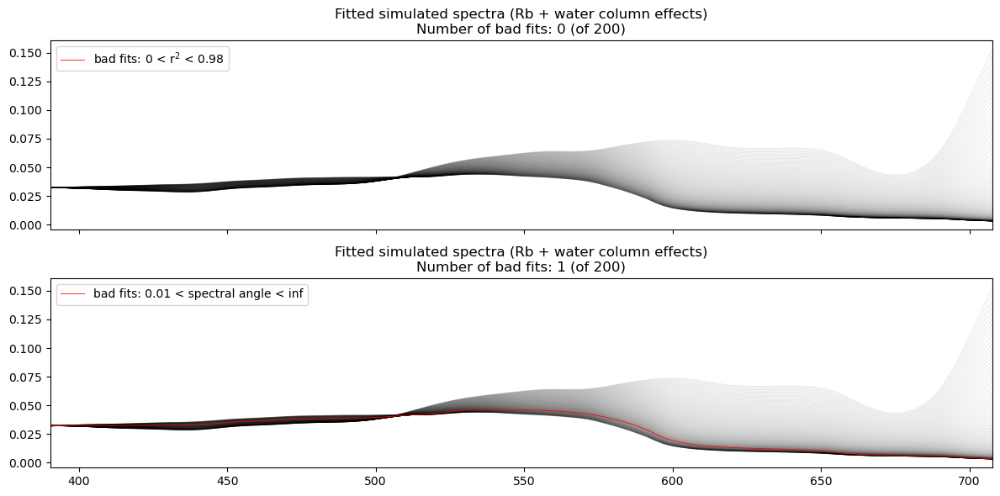

In [ ]:
r2_threshold = 0.9
sa_threshold = 0.01

metadata['r2'] = np.nan
metadata['spectral_angle'] = np.nan

for i, row in tqdm(fits.iterrows(), total=len(fits)):
    bb_m, bb_c, Kd_m, Kd_c = AOP_args
    bb, K, H = row.values[:3]
    pred = spectrum_utils.sub_surface_reflectance_Rb(sim_spectra_df.columns, endmember_array, bb, K, H, AOP_args, *row.values[3:])
    metadata.loc[i, 'r2'] = r2_score(sim_spectra_df.loc[i], pred)
    metadata.loc[i, 'spectral_angle'] = spectrum_utils.spectral_angle(sim_spectra_df.loc[i], pred)
    
def plot_good_bad_fits(ax, metric: str="r2", bad_fit_range: tuple[float, float]=[0,0.1], metric_name: str="r$^2$"):
    bad_inds = (metadata[metric] < max(bad_fit_range)) & (metadata[metric] > min(bad_fit_range))
    bad_fits = metadata[bad_inds]
    good_fits = metadata[~bad_inds]
    
    ax.plot(sim_spectra_df.columns, sim_spectra_df.loc[bad_fits.index].values.T, color='red', lw=0.6)
    ax.plot(sim_spectra_df.columns, sim_spectra_df.loc[good_fits.index].values.T, color='k', alpha=0.1, lw=0.6, zorder=-2)
    ax.plot([], [], color="red", lw=0.6, label=f"bad fits: {min(bad_fit_range)} < {metric_name} < {max(bad_fit_range)}")
    ax.set_title(f'Fitted simulated spectra (Rb + water column effects)\nNumber of bad fits: {bad_fits.shape[0]} (of {len(fits)})')
    ax.set_xlim(sim_spectra_df.columns.min(), sim_spectra_df.columns.max())
    ax.legend()
    return ax
    
    
fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
ax_r2 = plot_good_bad_fits(axes[0], "r2", [0, 0.98], "r$^2$")
ax_sa = plot_good_bad_fits(axes[1], "spectral_angle", [0.01, np.inf], "spectral angle")
plt.tight_layout()


# Simulating received spectra

In [3]:
# load features (spectra)
raw_spectra = spectrum_utils.load_spectra()
validation_spectra = spectrum_utils.preprocess_prism_spectra(raw_spectra, spectrum_utils.NIR_WAVELENGTHS, spectrum_utils.SENSOR_RANGE)

In [4]:
g_cfg, run_cfg = file_ops.instantiate_single_configs_instance(run_ind = 0)


sims = optimisation_pipeline.SimulateSpectra(run_cfg, g_cfg).generate_simulated_spectra()
# sims.head()

import plotly.graph_objects as go

# Create a Plotly figure
fig = go.Figure()

# Add traces for each spectrum
for i in range(sims.shape[0]):
    fig.add_trace(go.Scatter(
        x=sims.columns[4:],  # Wavelengths
        y=sims.iloc[i, 4:],  # Spectra values
        mode='lines',
        line=dict(color='black', width=1),
        opacity=0.05,
        hoverinfo='text',
        text=f"Depth: {sims.iloc[i]['depth']:.2f}, K: {sims.iloc[i]['K']:.2f}, bb: {sims.iloc[i]['bb']:.2f}"
    ))

# Update layout
fig.update_layout(
    title="Simulated Spectra",
    xaxis_title="Wavelength (nm)",
    yaxis_title="Reflectance",
    showlegend=False,
    width=1400,
    height=600,
    yaxis=dict(range=[0, max(validation_spectra.T.max())]),
)

# Show the figure
fig.show()

Generating simulated spectra:   0%|          | 0/1000 [00:00<?, ?it/s]

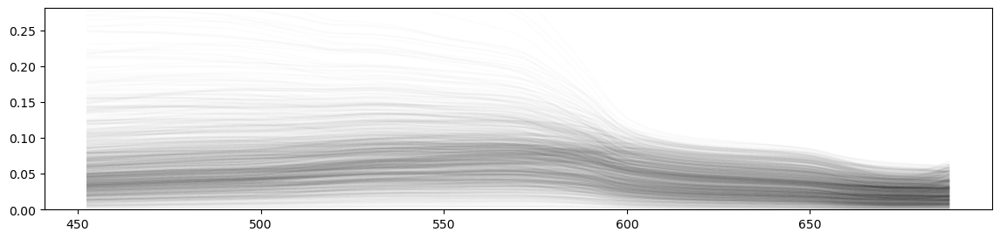

In [5]:
fig, ax = plt.subplots(1, 1, figsize=(14,3))
ax.plot(sims.iloc[:,4:].T, alpha=0.01, c='k');
ax.set_ylim(0, np.max(validation_spectra.T.max()));

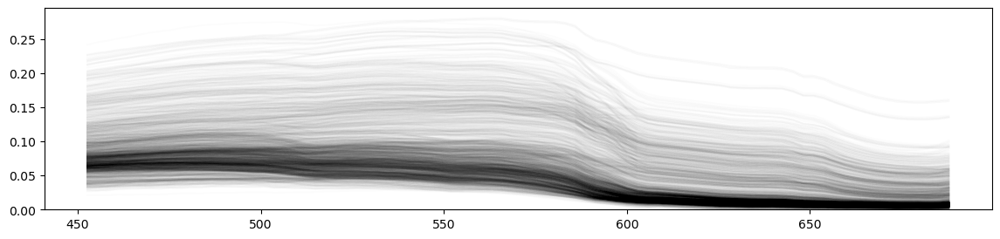

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(14,3))
ax.plot(validation_spectra.T, alpha=0.01, c='k');
ax.set_ylim(0);

In [33]:
fit_fp = "/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/coralreflections/results/fits/fit_results_1.csv"
fits = pd.read_csv(fit_fp, header=[0,1])
fitted_spectra = fits.fitted_spectra
fitted_spectra.columns = fitted_spectra.columns.astype(float)

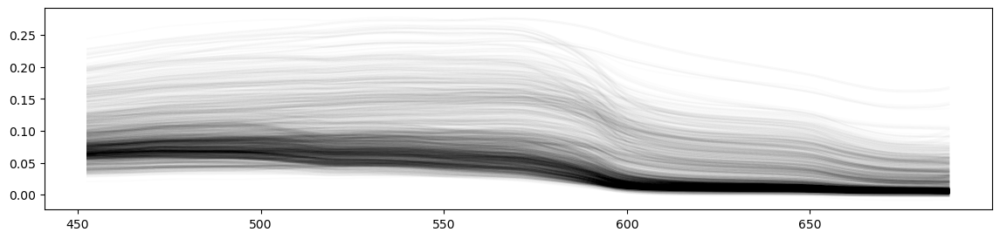

In [8]:
# plot example (good) fits
fit_fp = "/Users/rt582/Library/CloudStorage/OneDrive-UniversityofCambridge/cambridge/phd/coralreflections/results/fits/fit_results_1.csv"
fits = pd.read_csv(fit_fp, header=[0,1])
fits.fitted_params.head()
fig, ax = plt.subplots(1, 1, figsize=(14,3))
ax.plot(fits.fitted_spectra.columns.astype('float'), fits.fitted_spectra.T, alpha=0.01, c='k');

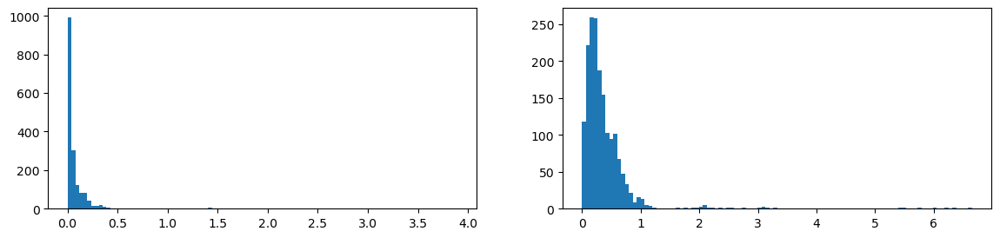

In [10]:
fig, ax = plt.subplots(1,2, figsize=(14,3))
# crop out values below 0
bb_vals = fits[fits.fitted_params.bb > 0]
K_vals = fits[fits.fitted_params.K > 0]
ax[0].hist(bb_vals.fitted_params.bb, bins=100);
ax[1].hist(K_vals.fitted_params.K, bins=100);

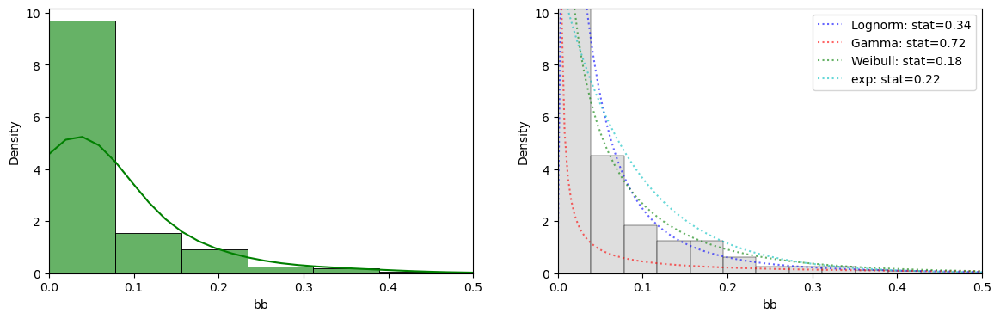

In [14]:
def fit_plot_distribution(data, xlims: tuple[float, float]=None):
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    hist = sns.histplot(data, bins=50, stat="density", alpha=0.6, color='g', kde=True, ax=axes[0]) 
    # fit distributions to bb and K
    shape, loc, scale = stats.lognorm.fit(data)
    lognorm_pdf = stats.lognorm.pdf(np.linspace(min(data), max(data), 1000), shape, loc=loc, scale=scale)

    alpha, loc, beta = stats.gamma.fit(data)
    gamma_pdf = stats.gamma.pdf(np.linspace(min(data), max(data), 1000), alpha, loc=loc, scale=beta)

    c, loc, scale = stats.weibull_min.fit(data)
    weibull_pdf = stats.weibull_min.pdf(np.linspace(min(data), max(data), 1000), c, loc=loc, scale=scale)
    
    # exponential fit
    loc, scale = stats.expon.fit(data)
    exp_pdf = stats.expon.pdf(np.linspace(min(data), max(data), 1000), loc=loc, scale=scale)

    lognorm_ks = stats.kstest(data, 'lognorm', args=(shape, loc, scale))
    gamma_ks = stats.kstest(data, 'gamma', args=(alpha, loc, beta))
    weibull_ks = stats.kstest(data, 'weibull_min', args=(c, loc, scale))
    exp_ks = stats.kstest(data, 'expon', args=(loc, scale))

    x = np.linspace(min(data), max(data), 1000)
    sns.histplot(data, bins=100, kde=False, stat='density', color='lightgray')
    # fig.suptitle([(f"{dist} {stat}: {getattr(ks, stat):.2f}\n") for dist, ks in zip(["Log-normal", "Gamma", "Weibull"], [lognorm_ks, gamma_ks, weibull_ks]) for stat in ["statistic", "pvalue"]])
    axes[1].plot(x, lognorm_pdf, label=f"Lognorm: stat={lognorm_ks.statistic:.02f}", color='blue', alpha=0.6, ls=":")
    axes[1].plot(x, gamma_pdf, label=f"Gamma: stat={gamma_ks.statistic:.02f}", color='red', alpha=0.6, ls=":")
    axes[1].plot(x, weibull_pdf, label=f"Weibull: stat={weibull_ks.statistic:.02f}", color='green', alpha=0.6, ls=":")
    axes[1].plot(x, exp_pdf, label=f"exp: stat={exp_ks.statistic:.02f}", color='c', alpha=0.6, ls=":")
    axes[1].legend()
    axes[1].set_ylim(0, np.max(hist.get_ylim()))
    [ax.set_xlim(xlims) for ax in axes] if xlims else None
    
    return lognorm_pdf, gamma_pdf, weibull_pdf, exp_pdf
    
    
lognorm_pdf_bb, gamma_pdf_bb, weibull_pdf_bb, exp_pdf_bb = fit_plot_distribution(bb_vals.fitted_params.bb,
                                                                     xlims = (0,0.5)
                                                                     )

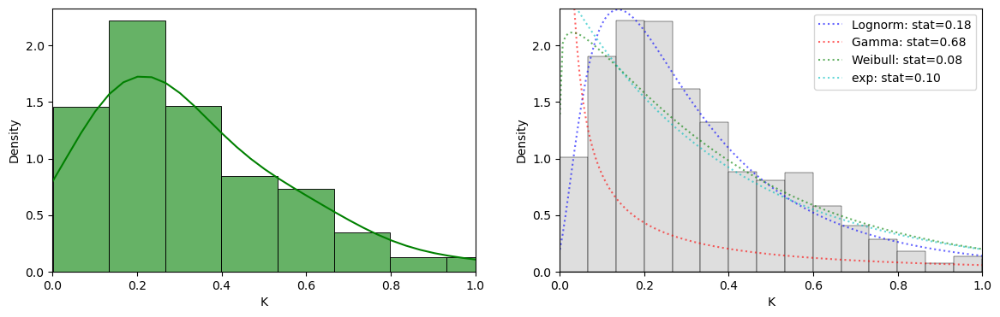

In [15]:
lognorm_pdf_k, gamma_pdf_k, weibull_pdf_k, exp_pdf_k = fit_plot_distribution(K_vals.fitted_params.K,
                                                                     xlims = (0,1)
                                                                     )

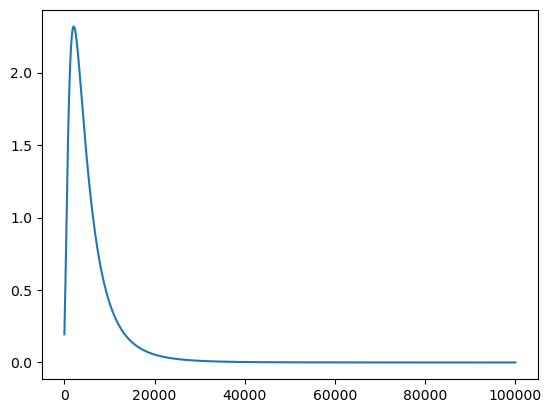

In [18]:
# from scipy.interpolate import interp1d
# from scipy import stats

    
# def interpolate_pdf(pdf, N_samples:int=1000):
#     interp_fn = interp1d(np.linspace(0, 1, len(pdf)), pdf, kind='linear', fill_value="extrapolate")
#     return interp_fn(np.linspace(0, 1, N_samples))


# plt.plot(interpolate_pdf(lognorm_pdf_k, 100000))

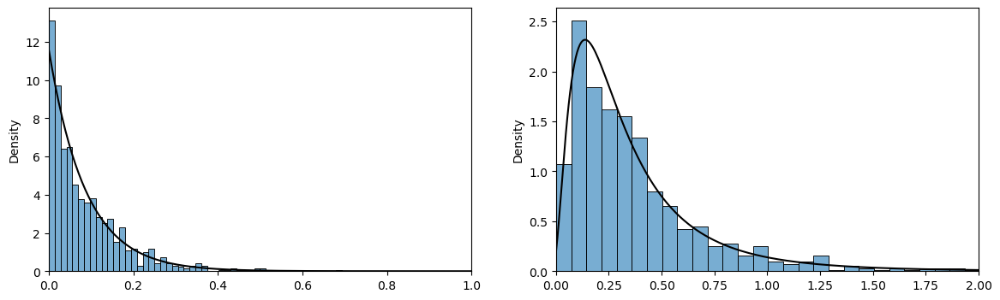

In [23]:
N_samples = 1000
f, axes = plt.subplots(1,2, figsize=(14, 4))
bb_sampling = np.random.choice(
    np.linspace(0, np.max(bb_vals.fitted_params.bb), N_samples), size=N_samples, p=exp_pdf_bb / np.sum(exp_pdf_bb)
)
sns.histplot(bb_sampling, bins=50, stat="density", alpha=0.6, ax=axes[0]) 
axes[0].plot(np.linspace(0, np.max(bb_vals.fitted_params.bb), N_samples), exp_pdf_bb, c="k", label="Exponential pdf")
axes[0].set_xlim(0,1)

k_sampling = np.random.choice(
    np.linspace(0, np.max(K_vals.fitted_params.K), N_samples), size=N_samples, p=lognorm_pdf_k / np.sum(lognorm_pdf_k)
)
sns.histplot(k_sampling, bins=50, stat="density", alpha=0.6, ax=axes[1])
axes[1].plot(np.linspace(0, np.max(K_vals.fitted_params.K), N_samples), lognorm_pdf_k, c="k", label="Log-normal pdf")
axes[1].set_xlim(0,2)

# save sampling distributions to numpy
np.save(file_ops.RESOURCES_DIR_FP / "distributions" / "bb_sampling.npy", bb_sampling)
np.save(file_ops.RESOURCES_DIR_FP / "distributions" / "k_sampling.npy", k_sampling)